In [1]:
import os
import json
import numpy as np

import bids
from bids import BIDSLayout
#from bids.analysis import auto_model
#from bids.analysis import Analysis

In [2]:
project_dir = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 'FLT/')
bidsroot = os.path.join(project_dir,'data_bids')
deriv_dir = os.path.join(project_dir, 'derivatives')

In [3]:
bidsroot

'/bgfs/bchandrasekaran/krs228/data/FLT/data_bids'

In [4]:
nilearn_dir = os.path.join(deriv_dir, 'nilearn')
if not os.path.exists(nilearn_dir):
        os.makedirs(nilearn_dir)

In [5]:
task_list = ['tonecat']

### import data with `pybids` and test out capabilities

based on: https://github.com/bids-standard/pybids/blob/master/examples/pybids_tutorial.ipynb

In [6]:
layout = BIDSLayout(bidsroot)

In [7]:
all_files = layout.get()

In [8]:
layout.get(return_type='filename', suffix='bold', task='tonecat',extension='nii.gz')


['/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT01/func/sub-FLT01_task-tonecat_run-02_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT01/func/sub-FLT01_task-tonecat_run-03_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT01/func/sub-FLT01_task-tonecat_run-04_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT01/func/sub-FLT01_task-tonecat_run-05_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT02/func/sub-FLT02_task-tonecat_run-01_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT02/func/sub-FLT02_task-tonecat_run-02_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT02/func/sub-FLT02_task-tonecat_run-03_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT02/func/sub-FLT02_task-tonecat_run-04_bold.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/sub-FLT02/func/sub-FLT02_task-tonecat_run-05_bold.nii.gz',
 '/bgfs/bchandrasek

In [9]:
task_list[0]

'tonecat'

## nilearn modeling: first level

based on: https://nilearn.github.io/auto_examples/04_glm_first_level/plot_bids_features.html#sphx-glr-auto-examples-04-glm-first-level-plot-bids-features-py

In [10]:
from nilearn.glm.first_level import first_level_from_bids
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn.reporting import make_glm_report

import nibabel as nib

from nilearn import plotting
import matplotlib.pyplot as plt
from scipy.stats import norm

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '


In [11]:
data_dir = bidsroot
derivatives_folder = os.path.join(deriv_dir, 'fmriprep') # os.path.join(bidsroot, 'derivatives', 'fmriprep')

In [12]:
print(derivatives_folder)

/bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep


#### testing bids files

## First level model

**NOTE**: runs across all participants

In [13]:
space_label = 'T1w' #'MNI152NLin2009cAsym' # 'T1w' 

task_label = 'tonecat'
fwhm_sub = 3.0 # 1.5

print(data_dir, task_label, space_label)
models, models_run_imgs, models_events, models_confounds = \
    first_level_from_bids(data_dir, task_label, space_label=space_label,
                          smoothing_fwhm=fwhm_sub,
                          derivatives_folder=derivatives_folder,
                          slice_time_ref=0.5)

/bgfs/bchandrasekaran/krs228/data/FLT/data_bids tonecat T1w
filters:  [('task', 'tonecat'), ('space', 'T1w')]


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:901: UserWarning: SliceTimingRef not found in file /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_desc-preproc_bold.json. It will be assumed that the slice timing reference is 0.0 percent of the repetition time. If it is not the case it will need to be set manually in the generated list of models
  warn('SliceTimingRef not found in file %s. It will be assumed'


filters:  [('task', 'tonecat'), ('space', 'T1w')]
filters:  [('task', 'tonecat'), ('space', 'T1w')]
filters:  [('task', 'tonecat'), ('space', 'T1w')]


In [14]:
models

[FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT01',
                 t_r=3.0),
 FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT03',
                 t_r=3.0),
 FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT04',
                 t_r=3.0),
 FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT05',
                 t_r=3.0)]

In [15]:
# check model image files
print([os.path.basename(run) for run in models_run_imgs[1]])


['sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz', 'sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz', 'sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz', 'sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz', 'sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz', 'sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz']


In [16]:
# check model confounds
print(models_confounds[0][0].columns)

Index(['global_signal', 'global_signal_derivative1',
       'global_signal_derivative1_power2', 'global_signal_power2', 'csf',
       'csf_derivative1', 'csf_power2', 'csf_derivative1_power2',
       'white_matter', 'white_matter_derivative1',
       ...
       'rot_y_power2', 'rot_y_derivative1_power2', 'rot_z',
       'rot_z_derivative1', 'rot_z_power2', 'rot_z_derivative1_power2',
       'motion_outlier00', 'motion_outlier01', 'motion_outlier02',
       'motion_outlier03'],
      dtype='object', length=134)


In [17]:
# fill n/a with 0
[[mc.fillna(0, inplace=True) for mc in sublist] for sublist in models_confounds]

# define which confounds to keep as nuisance regressors
conf_keep_list = ['framewise_displacement',
                  'a_comp_cor_00', 'a_comp_cor_01', 
                  'a_comp_cor_02', 'a_comp_cor_03', 
                  'a_comp_cor_04', 'a_comp_cor_05', 
                  'a_comp_cor_06', 'a_comp_cor_07', 
                  'a_comp_cor_08', 'a_comp_cor_09', 
                  'trans_x', 'trans_y', 'trans_z', 
                  'rot_x','rot_y', 'rot_z']

models_confounds[0][0][conf_keep_list].head()

,framewise_displacement,a_comp_cor_00,a_comp_cor_01,a_comp_cor_02,a_comp_cor_03,a_comp_cor_04,a_comp_cor_05,a_comp_cor_06,a_comp_cor_07,a_comp_cor_08,a_comp_cor_09,trans_x,trans_y,trans_z,rot_x,rot_y,rot_z
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.014128,0.017663,0.067285,-0.000446,-0.000386,-0.000456
1,0.063200,0.044095,-0.062307,0.029521,-0.044739,-0.137115,0.212272,-0.086081,0.257727,-0.067134,0.207814,-0.013672,0.024022,0.088612,-0.000798,-0.000160,-0.000578
2,0.050602,0.064663,-0.040317,0.013446,-0.006246,-0.123187,0.150143,-0.058056,0.241272,0.031624,0.236808,-0.020802,0.025886,0.073820,-0.000956,-0.000063,-0.000861
3,0.078863,0.090082,-0.052714,-0.041553,0.055181,-0.007816,0.166256,-0.077161,0.219163,0.138495,0.189512,-0.012099,0.033217,0.055777,-0.001104,0.000278,-0.000455
4,0.049879,0.090091,-0.041565,-0.027869,0.146096,0.040029,0.201153,-0.189227,0.026270,0.014556,0.109837,-0.015964,0.028537,0.070219,-0.000999,0.000447,-0.000719


In [18]:
models_events[3][3]

,Unnamed: 0,onset,duration,trial_type,response_time,stim_file,feedback
0,1,2.500000,0.3,di4-aN,0.654546,stimuli/di4-aN_48000Hz_pol2_S15filt.wav,right
1,2,8.477794,NaN,NaN,NaN,stimuli/null.wav,none
2,3,14.488966,0.3,di4-iN,0.049089,stimuli/di4-iN_48000Hz_pol2_S15filt.wav,right
3,4,20.483261,0.3,di1-bN,0.237764,stimuli/di1-bN_48000Hz_pol2_S15filt.wav,right
4,5,26.460890,0.3,di3-hN,0.597121,stimuli/di3-hN_48000Hz_pol2_S15filt.wav,right
...,...,...,...,...,...,...,...
60,61,NaN,NaN,NaN,NaN,NaN,wrong
61,62,NaN,NaN,NaN,NaN,NaN,wrong
62,63,NaN,NaN,NaN,NaN,NaN,wrong
63,64,NaN,NaN,NaN,NaN,NaN,wrong


In [19]:
print(len(models_events[1][0]))
print(len(models_events[0][1]))
print(len(models_events[0][2]))
print(len(models_events[0][3]))

65
65
55
65


In [20]:
# check conditions
print(models_events[3][3]['trial_type'].value_counts())
print(models_events[3][3]['feedback'].value_counts())

di3-bN    3
di1-hN    3
di1-iN    3
di2-aN    3
di2-bN    3
di3-aN    3
di2-iN    3
di2-hN    3
di1-aN    3
di4-aN    3
di4-bN    3
di3-iN    3
di4-iN    3
di3-hN    3
di1-bN    3
di4-hN    3
Name: trial_type, dtype: int64
right    48
none     12
wrong     5
Name: feedback, dtype: int64


In [21]:
# create stimulus list from updated events.tsv file
stim_list = sorted([s for s in models_events[0][0]['trial_type'].unique() if str(s) != 'nan'])

#### Feedback-based events

In [22]:
stim_list = sorted([s for s in models_events[0][0]['feedback'].unique() if str(s) != 'nan'])

In [23]:
stim_list

['none', 'right', 'wrong']

In [24]:
for sx, sub_events in enumerate(models_events):
    print(models[sx].subject_label)
    for mx, run_events in enumerate(sub_events):
        run_events['trial_type'] = run_events['feedback']
        run_events.loc[run_events.duration != 0.3, 'trial_type'] = np.nan
        print(run_events['trial_type'])

FLT01
0     wrong
1     wrong
2     right
3     right
4     right
5     right
6     right
7     right
8     right
9       NaN
10    right
11      NaN
12      NaN
13    wrong
14    right
15      NaN
16    right
17    right
18    right
19    right
20    right
21      NaN
22      NaN
23    right
24    wrong
25      NaN
26    right
27    right
28    right
29      NaN
30    right
31    right
32    right
33    right
34    right
35    wrong
36    right
37    right
38    right
39    right
40    right
41    right
42    right
43    right
44      NaN
45    right
46    right
47      NaN
48    right
49    right
50    right
51    right
52    right
53    right
54    right
55    right
56    right
57      NaN
58    right
59      NaN
Name: trial_type, dtype: object
0       NaN
1     right
2     right
3     right
4     right
      ...  
60      NaN
61      NaN
62      NaN
63      NaN
64      NaN
Name: trial_type, Length: 65, dtype: object
0     right
1     right
2     right
3     right
4       NaN
5     

In [25]:
# check some runs
models_events[1][2]['trial_type']

0     right
1     right
2     right
3     right
4     right
      ...  
60      NaN
61      NaN
62      NaN
63      NaN
64      NaN
Name: trial_type, Length: 65, dtype: object

In [26]:
stim_list = sorted([s for s in models_events[1][1]['trial_type'].unique() if str(s) != 'nan'])
print(stim_list)

['right', 'wrong']


#### Create feedback-based trial-specific events

In [27]:
for sx, sub_events in enumerate(models_events):
    print(models[sx].subject_label)
    for mx, run_events in enumerate(sub_events):

        name_groups = run_events.groupby('trial_type')['trial_type']
        suffix = name_groups.cumcount() + 1
        repeats = name_groups.transform('size')

        #run_events['trial_type'] = run_events['trial_type'] + '_trial' + \
        #                                     np.arange(len(run_events)).astype(str)

        run_events['trial_type'] = run_events['trial_type'] + \
                                             '_trial' + suffix.map(str)
        run_events['trial_type'] = run_events['trial_type'].str.replace('-','_')
        print(run_events['trial_type'])


FLT01
0      wrong_trial1
1      wrong_trial2
2      right_trial1
3      right_trial2
4      right_trial3
5      right_trial4
6      right_trial5
7      right_trial6
8      right_trial7
9               NaN
10     right_trial8
11              NaN
12              NaN
13     wrong_trial3
14     right_trial9
15              NaN
16    right_trial10
17    right_trial11
18    right_trial12
19    right_trial13
20    right_trial14
21              NaN
22              NaN
23    right_trial15
24     wrong_trial4
25              NaN
26    right_trial16
27    right_trial17
28    right_trial18
29              NaN
30    right_trial19
31    right_trial20
32    right_trial21
33    right_trial22
34    right_trial23
35     wrong_trial5
36    right_trial24
37    right_trial25
38    right_trial26
39    right_trial27
40    right_trial28
41    right_trial29
42    right_trial30
43    right_trial31
44              NaN
45    right_trial32
46    right_trial33
47              NaN
48    right_trial34
49    right_tr

In [28]:
stim_list = []
stim_list.extend(['right_' + str(x) for x in range(0,61)])
stim_list.extend(['wrong_' + str(x) for x in range(0,61)])

In [29]:
stim_list

['right_0',
 'right_1',
 'right_2',
 'right_3',
 'right_4',
 'right_5',
 'right_6',
 'right_7',
 'right_8',
 'right_9',
 'right_10',
 'right_11',
 'right_12',
 'right_13',
 'right_14',
 'right_15',
 'right_16',
 'right_17',
 'right_18',
 'right_19',
 'right_20',
 'right_21',
 'right_22',
 'right_23',
 'right_24',
 'right_25',
 'right_26',
 'right_27',
 'right_28',
 'right_29',
 'right_30',
 'right_31',
 'right_32',
 'right_33',
 'right_34',
 'right_35',
 'right_36',
 'right_37',
 'right_38',
 'right_39',
 'right_40',
 'right_41',
 'right_42',
 'right_43',
 'right_44',
 'right_45',
 'right_46',
 'right_47',
 'right_48',
 'right_49',
 'right_50',
 'right_51',
 'right_52',
 'right_53',
 'right_54',
 'right_55',
 'right_56',
 'right_57',
 'right_58',
 'right_59',
 'right_60',
 'wrong_0',
 'wrong_1',
 'wrong_2',
 'wrong_3',
 'wrong_4',
 'wrong_5',
 'wrong_6',
 'wrong_7',
 'wrong_8',
 'wrong_9',
 'wrong_10',
 'wrong_11',
 'wrong_12',
 'wrong_13',
 'wrong_14',
 'wrong_15',
 'wrong_16',
 'wron

#### Create stimulus-based trial-specific events

In [24]:
for mx, events in enumerate(models_events):
    print(len(events))

4
6
6
6


In [25]:
for sx, sub_events in enumerate(models_events):
    print(models[sx].subject_label)
    for mx, run_events in enumerate(sub_events):

        name_groups = run_events.groupby('trial_type')['trial_type']
        suffix = name_groups.cumcount() + 1
        repeats = name_groups.transform('size')

        #run_events['trial_type'] = run_events['trial_type'] + '_trial' + \
        #                                     np.arange(len(run_events)).astype(str)

        run_events['trial_type'] = run_events['trial_type'] + \
                                             '_trial' + suffix.map(str)
        run_events['trial_type'] = run_events['trial_type'].str.replace('-','_')
        print(run_events['trial_type'])


FLT01
0     di4_aN_trial1
1     di3_iN_trial1
2     di2_bN_trial1
3     di4_iN_trial1
4     di3_bN_trial1
5     di4_bN_trial1
6     di3_aN_trial1
7     di1_hN_trial1
8     di2_aN_trial1
9               NaN
10    di1_aN_trial1
11              NaN
12              NaN
13    di1_iN_trial1
14    di2_iN_trial1
15              NaN
16    di3_hN_trial1
17    di1_bN_trial1
18    di4_hN_trial1
19    di2_hN_trial1
20    di1_bN_trial2
21              NaN
22              NaN
23    di1_iN_trial2
24    di4_iN_trial2
25              NaN
26    di4_bN_trial2
27    di3_iN_trial2
28    di2_hN_trial2
29              NaN
30    di2_aN_trial2
31    di1_hN_trial2
32    di3_hN_trial2
33    di2_iN_trial2
34    di3_aN_trial2
35    di3_bN_trial2
36    di4_aN_trial2
37    di1_aN_trial2
38    di2_bN_trial2
39    di4_hN_trial2
40    di3_hN_trial3
41    di4_iN_trial3
42    di1_bN_trial3
43    di1_aN_trial3
44              NaN
45    di3_bN_trial3
46    di3_aN_trial3
47              NaN
48    di2_bN_trial3
49    di2_hN_t

In [145]:
# check some runs
models_events[1][2]['trial_type']

0     di3-hN
1     di4-iN
2     di3-aN
3     di1-bN
4     di2-hN
       ...  
60       NaN
61       NaN
62       NaN
63       NaN
64       NaN
Name: trial_type, Length: 65, dtype: object

In [27]:
# create stimulus list from updated events.tsv file
stim_list = sorted([s for s in run_events['trial_type'].unique() if str(s) != 'nan'])

In [28]:
len(stim_list)

48

#### Check the models 

In [142]:
models

[FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT01',
                 t_r=3.0),
 FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT03',
                 t_r=3.0),
 FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT04',
                 t_r=3.0),
 FirstLevelModel(slice_time_ref=0.5, smoothing_fwhm=3.0, subject_label='FLT05',
                 t_r=3.0)]

In [30]:

#    # only do new subject for now 
#    if not model.subject_label == '210728':
#        pass
#    else:

### Across-runs GLM

In [162]:
#contrast_label = 'sound' # 'right + wrong - none'
model_and_args = zip(models, models_run_imgs, models_events, models_confounds)
#for midx in range(len(models)):
for midx, (model, imgs, events, confounds) in enumerate(model_and_args):
    #for sx, stim in enumerate(stim_list):
    for sx, stim in enumerate(stim_list):
        contrast_label = stim
        contrast_desc  = stim
        print('stimulus =', stim)

        '''
        model = models[midx]
        imgs = models_run_imgs[midx]
        events = models_events[midx]
        confounds = models_confounds[midx]
        '''
        print(model.subject_label)

        # set limited confounds
        print('selecting confounds')
        confounds_ltd = [confounds[cx][conf_keep_list] for cx in range(len(confounds))]

        # fit the GLM
        print('fitting GLM')
        model.fit(imgs, events, confounds_ltd);

        # compute the contrast of interest
        print('computing contrast of interest')
        try:
            zmap = model.compute_contrast(contrast_label)

            # save z map
            print('saving z-map')
            nilearn_sub_dir = os.path.join(bidsroot, 'derivatives', 'nilearn', 
                                           'level-1_fwhm-%.02f'%fwhm_sub, 
                                           'sub-%s_space-%s'%(model.subject_label, space_label),
                                           'run-all')
            if not os.path.exists(nilearn_sub_dir):
                os.makedirs(nilearn_sub_dir)

            analysis_prefix = 'sub-%s_task-%s_fwhm-%.02f' \
                              '_space-%s_contrast-%s'%(model.subject_label, task_label, fwhm_sub,
                                                       space_label, contrast_desc)
            zmap_fpath = os.path.join(nilearn_sub_dir,
                                      analysis_prefix+'_zmap.nii.gz')
            nib.save(zmap, zmap_fpath)
            print('saved z map to ', zmap_fpath)

            '''
            # save report
            print('saving report')
            report_fpath = os.path.join(nilearn_sub_dir,
                                        analysis_prefix+'_report.html')
            report = make_glm_report(model=model,
                                     contrasts=contrast_label)
            report.save_as_html(report_fpath)
            print('saved report to ', report_fpath)
            '''
        except:
            pass

stimulus =  right
FLT01
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 4 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


saving z-map
saved z map to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-3.00/sub-FLT01_space-T1w/run-all/sub-FLT01_task-tonecat_fwhm-3.00_space-T1w_contrast-right_zmap.nii.gz
stimulus =  wrong
FLT01
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest
stimulus =  right
FLT03
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 4 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 6 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


saving z-map
saved z map to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-3.00/sub-FLT03_space-T1w/run-all/sub-FLT03_task-tonecat_fwhm-3.00_space-T1w_contrast-right_zmap.nii.gz
stimulus =  wrong
FLT03
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 6 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


saving z-map
saved z map to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-3.00/sub-FLT03_space-T1w/run-all/sub-FLT03_task-tonecat_fwhm-3.00_space-T1w_contrast-wrong_zmap.nii.gz
stimulus =  right
FLT04
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 6 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


saving z-map
saved z map to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-3.00/sub-FLT04_space-T1w/run-all/sub-FLT04_task-tonecat_fwhm-3.00_space-T1w_contrast-right_zmap.nii.gz
stimulus =  wrong
FLT04
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 6 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


saving z-map
saved z map to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-3.00/sub-FLT04_space-T1w/run-all/sub-FLT04_task-tonecat_fwhm-3.00_space-T1w_contrast-wrong_zmap.nii.gz
stimulus =  right
FLT05
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 6 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


saving z-map
saved z map to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-3.00/sub-FLT05_space-T1w/run-all/sub-FLT05_task-tonecat_fwhm-3.00_space-T1w_contrast-right_zmap.nii.gz
stimulus =  wrong
FLT05
selecting confounds
fitting GLM


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/first_level.py:657: UserWarning: One contrast given, assuming it for all 6 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


### Run-by-run GLM fit

In [31]:
stim_contrast_list = []

model_and_args = zip(models, models_run_imgs, models_events, models_confounds)

for midx, (model, imgs, events, confounds) in enumerate(model_and_args):
    print(model.subject_label)
    
    for sx, stim in enumerate(stim_list):
        contrast_label = stim
        contrast_desc  = stim
        print('running GLM with stimulus ', stim)

        # set limited confounds
        print('selecting confounds')
        confounds_ltd = [confounds[cx][conf_keep_list] for cx in range(len(confounds))]

        for rx in range(len(imgs)):
            img = imgs[rx]
            event = events[rx]
            confound = confounds_ltd[rx]

            try:
                # fit the GLM
                print('fitting GLM on ', img)
                model.fit(img, event, confound);

                # compute the contrast of interest
                print('computing contrast of interest', ' with contrast label = ', contrast_label)
                zmap = model.compute_contrast(contrast_label)

                # save z map
                print('saving z-map')
                nilearn_sub_dir = os.path.join(bidsroot, 'derivatives', 'nilearn', 
                                               'level-1_fwhm-%.02f'%fwhm_sub, 
                                               'sub-%s_space-%s'%(model.subject_label, space_label))
                nilearn_sub_run_dir = os.path.join(nilearn_sub_dir, 'trial_models', 'run%02d'%rx)

                os.makedirs(nilearn_sub_run_dir, exist_ok=True)

                analysis_prefix = ('sub-%s_task-%s_fwhm-%.02f_'
                                   'space-%s_contrast-%s_run%02d'%(model.subject_label,
                                                                   task_label, fwhm_sub,
                                                                   space_label, contrast_desc,
                                                                   rx))
                zmap_fpath = os.path.join(nilearn_sub_run_dir,
                                          analysis_prefix+'_zmap.nii.gz')
                nib.save(zmap, zmap_fpath)
                print('saved z map to ', zmap_fpath)

                stim_contrast_list.append(contrast_label)

                """
                # save report
                print('saving report')
                report_fpath = os.path.join(nilearn_sub_dir,
                                            analysis_prefix+'_report.html')
                report = make_glm_report(model=model,
                                         contrasts=contrast_label)
                report.save_as_html(report_fpath)
                print('saved report to ', report_fpath)
                """
            except:
                print('could not run for ', img, ' with ', contrast_label)

FLT01
running GLM with stimulus  right_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_0
running GLM with stimulus  right_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_1
running GLM with stimulus  right_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_2
running GLM with stimulus  right_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_3
running GLM with stimulus  right_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_4
running GLM with stimulus  right_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_5
running GLM with stimulus  right_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_6
running GLM with stimulus  right_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_7
running GLM with stimulus  right_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_8
running GLM with stimulus  right_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_9
running GLM with stimulus  right_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_10
running GLM with stimulus  right_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_11
running GLM with stimulus  right_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_12
running GLM with stimulus  right_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_13
running GLM with stimulus  right_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_14
running GLM with stimulus  right_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_15
running GLM with stimulus  right_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_16
running GLM with stimulus  right_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_17
running GLM with stimulus  right_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_18
running GLM with stimulus  right_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_19
running GLM with stimulus  right_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_20
running GLM with stimulus  right_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_21
running GLM with stimulus  right_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_22
running GLM with stimulus  right_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_23
running GLM with stimulus  right_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_24
running GLM with stimulus  right_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_25
running GLM with stimulus  right_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_26
running GLM with stimulus  right_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_27
running GLM with stimulus  right_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_28
running GLM with stimulus  right_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_29
running GLM with stimulus  right_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_30
running GLM with stimulus  right_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_31
running GLM with stimulus  right_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_32
running GLM with stimulus  right_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_33
running GLM with stimulus  right_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_34
running GLM with stimulus  right_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_35
running GLM with stimulus  right_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_36
running GLM with stimulus  right_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_37
running GLM with stimulus  right_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_38
running GLM with stimulus  right_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_39
running GLM with stimulus  right_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_40
running GLM with stimulus  right_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_41
running GLM with stimulus  right_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_42
running GLM with stimulus  right_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_43
running GLM with stimulus  right_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_44
running GLM with stimulus  right_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_45
running GLM with stimulus  right_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_46
running GLM with stimulus  right_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_47
running GLM with stimulus  right_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_48
running GLM with stimulus  right_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_49
running GLM with stimulus  right_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_50
running GLM with stimulus  right_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_51
running GLM with stimulus  right_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_52
running GLM with stimulus  right_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_53
running GLM with stimulus  right_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_54
running GLM with stimulus  right_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_55
running GLM with stimulus  right_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_56
running GLM with stimulus  right_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_57
running GLM with stimulus  right_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_58
running GLM with stimulus  right_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_59
running GLM with stimulus  right_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_60
running GLM with stimulus  wrong_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
running GLM with stimulus  wrong_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
running GLM with stimulus  wrong_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
running GLM with stimulus  wrong_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
running GLM with stimulus  wrong_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
running GLM with stimulus  wrong_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
running GLM with stimulus  wrong_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
running GLM with stimulus  wrong_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
running GLM with stimulus  wrong_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
running GLM with stimulus  wrong_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
running GLM with stimulus  wrong_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
running GLM with stimulus  wrong_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
running GLM with stimulus  wrong_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
running GLM with stimulus  wrong_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
running GLM with stimulus  wrong_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
running GLM with stimulus  wrong_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
running GLM with stimulus  wrong_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
running GLM with stimulus  wrong_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
running GLM with stimulus  wrong_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
running GLM with stimulus  wrong_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
running GLM with stimulus  wrong_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
running GLM with stimulus  wrong_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
running GLM with stimulus  wrong_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
running GLM with stimulus  wrong_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
running GLM with stimulus  wrong_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
running GLM with stimulus  wrong_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
running GLM with stimulus  wrong_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
running GLM with stimulus  wrong_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
running GLM with stimulus  wrong_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
running GLM with stimulus  wrong_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
running GLM with stimulus  wrong_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
running GLM with stimulus  wrong_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
running GLM with stimulus  wrong_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
running GLM with stimulus  wrong_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
running GLM with stimulus  wrong_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
running GLM with stimulus  wrong_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
running GLM with stimulus  wrong_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
running GLM with stimulus  wrong_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
running GLM with stimulus  wrong_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
running GLM with stimulus  wrong_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
running GLM with stimulus  wrong_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
running GLM with stimulus  wrong_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
running GLM with stimulus  wrong_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
running GLM with stimulus  wrong_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
running GLM with stimulus  wrong_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
running GLM with stimulus  wrong_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
running GLM with stimulus  wrong_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
running GLM with stimulus  wrong_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
running GLM with stimulus  wrong_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
running GLM with stimulus  wrong_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
running GLM with stimulus  wrong_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
running GLM with stimulus  wrong_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
running GLM with stimulus  wrong_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
running GLM with stimulus  wrong_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
running GLM with stimulus  wrong_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
running GLM with stimulus  wrong_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
running GLM with stimulus  wrong_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
running GLM with stimulus  wrong_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
running GLM with stimulus  wrong_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
running GLM with stimulus  wrong_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
running GLM with stimulus  wrong_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/func/sub-FLT01_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
FLT03
running GLM with stimulus  right_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_0
running GLM with stimulus  right_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_1
running GLM with stimulus  right_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_2
running GLM with stimulus  right_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_3
running GLM with stimulus  right_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_4
running GLM with stimulus  right_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_5
running GLM with stimulus  right_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_6
running GLM with stimulus  right_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_7
running GLM with stimulus  right_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_8
running GLM with stimulus  right_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_9
running GLM with stimulus  right_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_10
running GLM with stimulus  right_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_11
running GLM with stimulus  right_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_12
running GLM with stimulus  right_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_13
running GLM with stimulus  right_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_14
running GLM with stimulus  right_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_15
running GLM with stimulus  right_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_16
running GLM with stimulus  right_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_17
running GLM with stimulus  right_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_18
running GLM with stimulus  right_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_19
running GLM with stimulus  right_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_20
running GLM with stimulus  right_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_21
running GLM with stimulus  right_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_22
running GLM with stimulus  right_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_23
running GLM with stimulus  right_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_24
running GLM with stimulus  right_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_25
running GLM with stimulus  right_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_26
running GLM with stimulus  right_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_27
running GLM with stimulus  right_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_28
running GLM with stimulus  right_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_29
running GLM with stimulus  right_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_30
running GLM with stimulus  right_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_31
running GLM with stimulus  right_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_32
running GLM with stimulus  right_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_33
running GLM with stimulus  right_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_34
running GLM with stimulus  right_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_35
running GLM with stimulus  right_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_36
running GLM with stimulus  right_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_37
running GLM with stimulus  right_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_38
running GLM with stimulus  right_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_39
running GLM with stimulus  right_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_40
running GLM with stimulus  right_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_41
running GLM with stimulus  right_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_42
running GLM with stimulus  right_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_43
running GLM with stimulus  right_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_44
running GLM with stimulus  right_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_45
running GLM with stimulus  right_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_46
running GLM with stimulus  right_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_47
running GLM with stimulus  right_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_48
running GLM with stimulus  right_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_49
running GLM with stimulus  right_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_50
running GLM with stimulus  right_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_51
running GLM with stimulus  right_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_52
running GLM with stimulus  right_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_53
running GLM with stimulus  right_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_54
running GLM with stimulus  right_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_55
running GLM with stimulus  right_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_56
running GLM with stimulus  right_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_57
running GLM with stimulus  right_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_58
running GLM with stimulus  right_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_59
running GLM with stimulus  right_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_60
running GLM with stimulus  wrong_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
running GLM with stimulus  wrong_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
running GLM with stimulus  wrong_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
running GLM with stimulus  wrong_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
running GLM with stimulus  wrong_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
running GLM with stimulus  wrong_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
running GLM with stimulus  wrong_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
running GLM with stimulus  wrong_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
running GLM with stimulus  wrong_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
running GLM with stimulus  wrong_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
running GLM with stimulus  wrong_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
running GLM with stimulus  wrong_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
running GLM with stimulus  wrong_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
running GLM with stimulus  wrong_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
running GLM with stimulus  wrong_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
running GLM with stimulus  wrong_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
running GLM with stimulus  wrong_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
running GLM with stimulus  wrong_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
running GLM with stimulus  wrong_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
running GLM with stimulus  wrong_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
running GLM with stimulus  wrong_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
running GLM with stimulus  wrong_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
running GLM with stimulus  wrong_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
running GLM with stimulus  wrong_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
running GLM with stimulus  wrong_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
running GLM with stimulus  wrong_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
running GLM with stimulus  wrong_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
running GLM with stimulus  wrong_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
running GLM with stimulus  wrong_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
running GLM with stimulus  wrong_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
running GLM with stimulus  wrong_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
running GLM with stimulus  wrong_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
running GLM with stimulus  wrong_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
running GLM with stimulus  wrong_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
running GLM with stimulus  wrong_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
running GLM with stimulus  wrong_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
running GLM with stimulus  wrong_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
running GLM with stimulus  wrong_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
running GLM with stimulus  wrong_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
running GLM with stimulus  wrong_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
running GLM with stimulus  wrong_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
running GLM with stimulus  wrong_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
running GLM with stimulus  wrong_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
running GLM with stimulus  wrong_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
running GLM with stimulus  wrong_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
running GLM with stimulus  wrong_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
running GLM with stimulus  wrong_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
running GLM with stimulus  wrong_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
running GLM with stimulus  wrong_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
running GLM with stimulus  wrong_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
running GLM with stimulus  wrong_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
running GLM with stimulus  wrong_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
running GLM with stimulus  wrong_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
running GLM with stimulus  wrong_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
running GLM with stimulus  wrong_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
running GLM with stimulus  wrong_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
running GLM with stimulus  wrong_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
running GLM with stimulus  wrong_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
running GLM with stimulus  wrong_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
running GLM with stimulus  wrong_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
running GLM with stimulus  wrong_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/func/sub-FLT03_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
FLT04
running GLM with stimulus  right_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_0
running GLM with stimulus  right_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_1
running GLM with stimulus  right_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_2
running GLM with stimulus  right_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_3
running GLM with stimulus  right_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_4
running GLM with stimulus  right_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_5
running GLM with stimulus  right_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_6
running GLM with stimulus  right_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_7
running GLM with stimulus  right_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_8
running GLM with stimulus  right_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_9
running GLM with stimulus  right_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_10
running GLM with stimulus  right_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_11
running GLM with stimulus  right_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_12
running GLM with stimulus  right_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_13
running GLM with stimulus  right_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_14
running GLM with stimulus  right_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_15
running GLM with stimulus  right_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_16
running GLM with stimulus  right_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_17
running GLM with stimulus  right_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_18
running GLM with stimulus  right_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_19
running GLM with stimulus  right_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_20
running GLM with stimulus  right_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_21
running GLM with stimulus  right_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_22
running GLM with stimulus  right_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_23
running GLM with stimulus  right_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_24
running GLM with stimulus  right_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_25
running GLM with stimulus  right_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_26
running GLM with stimulus  right_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_27
running GLM with stimulus  right_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_28
running GLM with stimulus  right_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_29
running GLM with stimulus  right_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_30
running GLM with stimulus  right_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_31
running GLM with stimulus  right_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_32
running GLM with stimulus  right_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_33
running GLM with stimulus  right_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_34
running GLM with stimulus  right_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_35
running GLM with stimulus  right_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_36
running GLM with stimulus  right_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_37
running GLM with stimulus  right_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_38
running GLM with stimulus  right_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_39
running GLM with stimulus  right_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_40
running GLM with stimulus  right_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_41
running GLM with stimulus  right_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_42
running GLM with stimulus  right_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_43
running GLM with stimulus  right_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_44
running GLM with stimulus  right_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_45
running GLM with stimulus  right_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_46
running GLM with stimulus  right_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_47
running GLM with stimulus  right_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_48
running GLM with stimulus  right_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_49
running GLM with stimulus  right_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_50
running GLM with stimulus  right_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_51
running GLM with stimulus  right_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_52
running GLM with stimulus  right_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_53
running GLM with stimulus  right_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_54
running GLM with stimulus  right_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_55
running GLM with stimulus  right_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_56
running GLM with stimulus  right_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_57
running GLM with stimulus  right_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_58
running GLM with stimulus  right_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_59
running GLM with stimulus  right_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_60
running GLM with stimulus  wrong_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
running GLM with stimulus  wrong_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
running GLM with stimulus  wrong_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
running GLM with stimulus  wrong_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
running GLM with stimulus  wrong_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
running GLM with stimulus  wrong_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
running GLM with stimulus  wrong_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
running GLM with stimulus  wrong_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
running GLM with stimulus  wrong_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
running GLM with stimulus  wrong_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
running GLM with stimulus  wrong_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
running GLM with stimulus  wrong_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
running GLM with stimulus  wrong_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
running GLM with stimulus  wrong_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
running GLM with stimulus  wrong_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
running GLM with stimulus  wrong_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
running GLM with stimulus  wrong_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
running GLM with stimulus  wrong_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
running GLM with stimulus  wrong_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
running GLM with stimulus  wrong_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
running GLM with stimulus  wrong_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
running GLM with stimulus  wrong_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
running GLM with stimulus  wrong_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
running GLM with stimulus  wrong_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
running GLM with stimulus  wrong_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
running GLM with stimulus  wrong_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
running GLM with stimulus  wrong_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
running GLM with stimulus  wrong_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
running GLM with stimulus  wrong_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
running GLM with stimulus  wrong_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
running GLM with stimulus  wrong_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
running GLM with stimulus  wrong_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
running GLM with stimulus  wrong_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
running GLM with stimulus  wrong_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
running GLM with stimulus  wrong_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
running GLM with stimulus  wrong_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
running GLM with stimulus  wrong_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
running GLM with stimulus  wrong_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
running GLM with stimulus  wrong_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
running GLM with stimulus  wrong_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
running GLM with stimulus  wrong_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
running GLM with stimulus  wrong_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
running GLM with stimulus  wrong_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
running GLM with stimulus  wrong_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
running GLM with stimulus  wrong_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
running GLM with stimulus  wrong_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
running GLM with stimulus  wrong_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
running GLM with stimulus  wrong_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
running GLM with stimulus  wrong_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
running GLM with stimulus  wrong_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
running GLM with stimulus  wrong_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
running GLM with stimulus  wrong_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
running GLM with stimulus  wrong_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
running GLM with stimulus  wrong_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
running GLM with stimulus  wrong_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
running GLM with stimulus  wrong_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
running GLM with stimulus  wrong_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
running GLM with stimulus  wrong_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
running GLM with stimulus  wrong_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
running GLM with stimulus  wrong_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
running GLM with stimulus  wrong_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/func/sub-FLT04_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
FLT05
running GLM with stimulus  right_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_0
running GLM with stimulus  right_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_1
running GLM with stimulus  right_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_2
running GLM with stimulus  right_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_3
running GLM with stimulus  right_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_4
running GLM with stimulus  right_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_5
running GLM with stimulus  right_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_6
running GLM with stimulus  right_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_7
running GLM with stimulus  right_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_8
running GLM with stimulus  right_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_9
running GLM with stimulus  right_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_10
running GLM with stimulus  right_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_11
running GLM with stimulus  right_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_12
running GLM with stimulus  right_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_13
running GLM with stimulus  right_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_14
running GLM with stimulus  right_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_15
running GLM with stimulus  right_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_16
running GLM with stimulus  right_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_17
running GLM with stimulus  right_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_18
running GLM with stimulus  right_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_19
running GLM with stimulus  right_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_20
running GLM with stimulus  right_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_21
running GLM with stimulus  right_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_22
running GLM with stimulus  right_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_23
running GLM with stimulus  right_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_24
running GLM with stimulus  right_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_25
running GLM with stimulus  right_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_26
running GLM with stimulus  right_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_27
running GLM with stimulus  right_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_28
running GLM with stimulus  right_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_29
running GLM with stimulus  right_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_30
running GLM with stimulus  right_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_31
running GLM with stimulus  right_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_32
running GLM with stimulus  right_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_33
running GLM with stimulus  right_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_34
running GLM with stimulus  right_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_35
running GLM with stimulus  right_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_36
running GLM with stimulus  right_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_37
running GLM with stimulus  right_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_38
running GLM with stimulus  right_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_39
running GLM with stimulus  right_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_40
running GLM with stimulus  right_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_41
running GLM with stimulus  right_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_42
running GLM with stimulus  right_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_43
running GLM with stimulus  right_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_44
running GLM with stimulus  right_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_45
running GLM with stimulus  right_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_46
running GLM with stimulus  right_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_47
running GLM with stimulus  right_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_48
running GLM with stimulus  right_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_49
running GLM with stimulus  right_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_50
running GLM with stimulus  right_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_51
running GLM with stimulus  right_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_52
running GLM with stimulus  right_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_53
running GLM with stimulus  right_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_54
running GLM with stimulus  right_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_55
running GLM with stimulus  right_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_56
running GLM with stimulus  right_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_57
running GLM with stimulus  right_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_58
running GLM with stimulus  right_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_59
running GLM with stimulus  right_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  right_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  right_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  right_60
running GLM with stimulus  wrong_0
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_0
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_0
running GLM with stimulus  wrong_1
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_1
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_1
running GLM with stimulus  wrong_2
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_2
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_2
running GLM with stimulus  wrong_3
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_3
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_3
running GLM with stimulus  wrong_4
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_4
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_4
running GLM with stimulus  wrong_5
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_5
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_5
running GLM with stimulus  wrong_6
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_6
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_6
running GLM with stimulus  wrong_7
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_7
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_7
running GLM with stimulus  wrong_8
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_8
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_8
running GLM with stimulus  wrong_9
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_9
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_9
running GLM with stimulus  wrong_10
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_10
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_10
running GLM with stimulus  wrong_11
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_11
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_11
running GLM with stimulus  wrong_12
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_12
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_12
running GLM with stimulus  wrong_13
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_13
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_13
running GLM with stimulus  wrong_14
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_14
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_14
running GLM with stimulus  wrong_15
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_15
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_15
running GLM with stimulus  wrong_16
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_16
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_16
running GLM with stimulus  wrong_17
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_17
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_17
running GLM with stimulus  wrong_18
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_18
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_18
running GLM with stimulus  wrong_19
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_19
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_19
running GLM with stimulus  wrong_20
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_20
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_20
running GLM with stimulus  wrong_21
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_21
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_21
running GLM with stimulus  wrong_22
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_22
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_22
running GLM with stimulus  wrong_23
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_23
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_23
running GLM with stimulus  wrong_24
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_24
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_24
running GLM with stimulus  wrong_25
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_25
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_25
running GLM with stimulus  wrong_26
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_26
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_26
running GLM with stimulus  wrong_27
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_27
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_27
running GLM with stimulus  wrong_28
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_28
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_28
running GLM with stimulus  wrong_29
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_29
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_29
running GLM with stimulus  wrong_30
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_30
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_30
running GLM with stimulus  wrong_31
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_31
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_31
running GLM with stimulus  wrong_32
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_32
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_32
running GLM with stimulus  wrong_33
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_33
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_33
running GLM with stimulus  wrong_34
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_34
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_34
running GLM with stimulus  wrong_35
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_35
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_35
running GLM with stimulus  wrong_36
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_36
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_36
running GLM with stimulus  wrong_37
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_37
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_37
running GLM with stimulus  wrong_38
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_38
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_38
running GLM with stimulus  wrong_39
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_39
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_39
running GLM with stimulus  wrong_40
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_40
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_40
running GLM with stimulus  wrong_41
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_41
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_41
running GLM with stimulus  wrong_42
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_42
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_42
running GLM with stimulus  wrong_43
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_43
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_43
running GLM with stimulus  wrong_44
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_44
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_44
running GLM with stimulus  wrong_45
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_45
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_45
running GLM with stimulus  wrong_46
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_46
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_46
running GLM with stimulus  wrong_47
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_47
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_47
running GLM with stimulus  wrong_48
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_48
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_48
running GLM with stimulus  wrong_49
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_49
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_49
running GLM with stimulus  wrong_50
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_50
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_50
running GLM with stimulus  wrong_51
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_51
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_51
running GLM with stimulus  wrong_52
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_52
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_52
running GLM with stimulus  wrong_53
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_53
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_53
running GLM with stimulus  wrong_54
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_54
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_54
running GLM with stimulus  wrong_55
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_55
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_55
running GLM with stimulus  wrong_56
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_56
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_56
running GLM with stimulus  wrong_57
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_57
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_57
running GLM with stimulus  wrong_58
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_58
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_58
running GLM with stimulus  wrong_59
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_59
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_59
running GLM with stimulus  wrong_60
selecting confounds
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-1_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-2_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-3_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-4_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-5_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60
fitting GLM on  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `response_time` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `Unnamed: 0` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `stim_file` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `feedback` in events dat

computing contrast of interest  with contrast label =  wrong_60
could not run for  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/func/sub-FLT05_task-tonecat_run-6_space-T1w_desc-preproc_bold.nii.gz  with  wrong_60


In [75]:
from scipy.stats import norm
p_val = 0.005
thresh_unc = norm.isf(p_val)

In [ ]:
# plot
fig, axes = plt.subplots(3, 1, figsize=(20, 15))
plotting.plot_stat_map(zmap, bg_img=t1w_fpath, colorbar=True, threshold=thresh_unc,
                      title='sub-%s %s (unc p<%.03f; fwhm=%.02f)'%(model.subject_label, 
                                                                   contrast_label ,p_val,fwhm_sub),
                      axes=axes[0],
                      display_mode='x', cut_coords=6)
plotting.plot_stat_map(zmap, bg_img=t1w_fpath, colorbar=True, threshold=thresh_unc,
                       axes=axes[1],
                       display_mode='y', cut_coords=6)
plotting.plot_stat_map(zmap, bg_img=t1w_fpath, colorbar=True, threshold=thresh_unc,
                       axes=axes[2],
                       display_mode='z', cut_coords=6)
plotting.show()

# save plot
plot_fpath = os.path.join(nilearn_dir, 
                          'sub-%s_task-%s_fwhm-%.02f_pval-%.03f_space-%s_contrast-%s.png'%(model.subject_label,
                                                                    task_label,fwhm_sub, p_val,
                                                                    space_label, contrast_desc))
#fig.savefig(plot_fpath)

## plot tsnr

In [ ]:
bold_files

In [ ]:
t1w_fpath

In [ ]:
from nilearn import image

In [ ]:
thresh = 0
fwhm = 5

for fx,filepath in enumerate(bold_files):
    tsnr_func = image.math_img('img.mean(axis=3) / img.std(axis=3)', img=filepath)

    tsnr_func_smooth = image.smooth_img(tsnr_func, fwhm=5)

    display = plotting.plot_stat_map(tsnr_func_smooth, 
                                     bg_img=t1w_fpath, 
                                     #title='fMRI single run tSNR map',
                                     #cut_coords=[8,50,-20],
                                     #threshold=thresh, 
                                     #cmap='jet'
                                    );

## generate anatomical STG masks

In [41]:
from scipy.ndimage import binary_dilation
from nilearn.image import resample_to_img

from nilearn.masking import apply_mask
from nilearn.masking import unmask

FLT01
/bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT01/anat/sub-FLT01_desc-aparcaseg_dseg.nii.gz
saved to  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/nilearn/sub-FLT01_mask-aud-ctx.nii.gz
FLT03
/bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT03/anat/sub-FLT03_desc-aparcaseg_dseg.nii.gz
saved to  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/nilearn/sub-FLT03_mask-aud-ctx.nii.gz
FLT04
/bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT04/anat/sub-FLT04_desc-aparcaseg_dseg.nii.gz
saved to  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/nilearn/sub-FLT04_mask-aud-ctx.nii.gz
FLT05
/bgfs/bchandrasekaran/krs228/data/FLT/derivatives/fmriprep/sub-FLT05/anat/sub-FLT05_desc-aparcaseg_dseg.nii.gz
saved to  /bgfs/bchandrasekaran/krs228/data/FLT/derivatives/nilearn/sub-FLT05_mask-aud-ctx.nii.gz


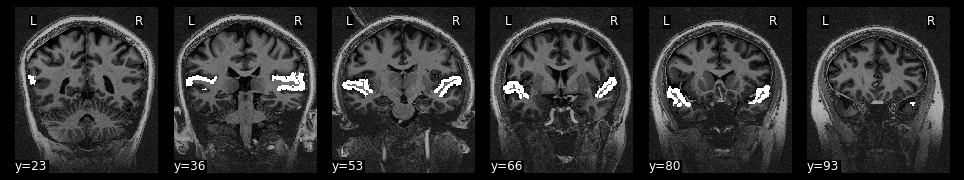

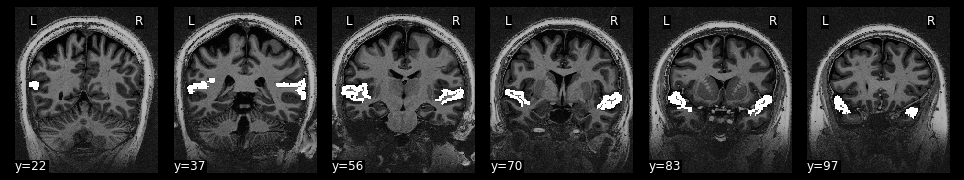

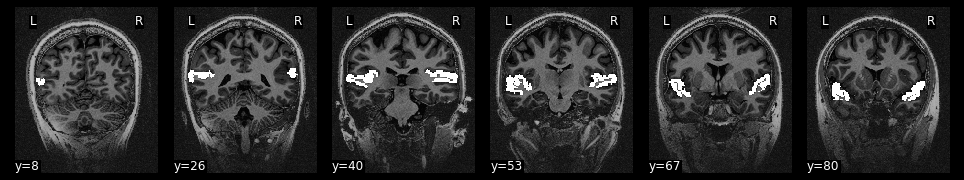

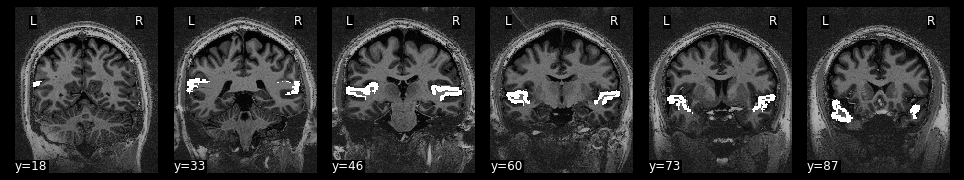

In [91]:
for mx in range(len(models)):
    sub_id = models[mx].subject_label
    print(sub_id)
    
    zmap_example_fpath = os.path.join('/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/',
                                      'derivatives/nilearn/level-1_fwhm-1.50/',
                                      'sub-%s_space-T1w/trial_models/run00/'%sub_id,
                                      'sub-%s_task-tonecat_fwhm-1.50_space-T1w_contrast-di1_aN_trial3_run00_zmap.nii.gz'%sub_id)
    
    aparc_fpath = os.path.join(deriv_dir, 'fmriprep/','sub-%s/anat'%sub_id,
                                'sub-%s_desc-aparcaseg_dseg.nii.gz'%sub_id)
    print(aparc_fpath)
    aparc_img = nib.load(aparc_fpath)
    aparc_data = aparc_img.get_fdata()
    aparc_affine = aparc_img.affine

    roi_dict = {'lh_stg': 1030, 'lh_hg': 1034, 'rh_stg': 2030, 'rh_hg': 2034}
    lh_labels = list(roi_dict.values())[:2]
    rh_labels = list(roi_dict.values())[2:]

    lh_mask = np.zeros(aparc_data.shape)
    lh_mask[np.where(aparc_data == 1030)] = 1
    lh_mask[np.where(aparc_data == 1034)] = 1

    rh_mask = np.zeros(aparc_data.shape)
    rh_mask[np.where(aparc_data == 2030)] = 1
    rh_mask[np.where(aparc_data == 2034)] = 1

    lh_mask_img = nib.Nifti1Image(lh_mask, aparc_affine)
    rh_mask_img = nib.Nifti1Image(rh_mask, aparc_affine)

    lh_mask_func_img = resample_to_img(lh_mask_img, zmap_example_fpath, interpolation='nearest')
    rh_mask_func_img = resample_to_img(rh_mask_img, zmap_example_fpath, interpolation='nearest')

    '''
    nib.save(lh_mask_func_img, os.path.join(nilearn_dir,
                                             'sub-%s_mask-L-TTG.nii.gz'%sub_id))
    nib.save(rh_mask_func_img, os.path.join(nilearn_dir,
                                             'sub-%s_mask-R-TTG.nii.gz'%sub_id))
    '''
    nib.save(lh_mask_func_img, os.path.join(nilearn_dir,
                                             'sub-%s_mask-L-aud-ctx.nii.gz'%sub_id))
    nib.save(rh_mask_func_img, os.path.join(nilearn_dir,
                                             'sub-%s_mask-R-aud-ctx.nii.gz'%sub_id))

    # join into single mask across both hemispheres
    aud_mask = np.zeros(aparc_data.shape)
    aud_mask[np.where(lh_mask == 1)] = 1
    aud_mask[np.where(rh_mask == 1)] = 1

    aud_mask_dil = binary_dilation(aud_mask).astype(aud_mask.dtype)

    aud_mask_anat_img = nib.Nifti1Image(aud_mask_dil, affine=aparc_affine)
    aud_mask_func_img = resample_to_img(aud_mask_anat_img, zmap_example_fpath, interpolation='nearest')

    #print(zmap_example_fpath.get_fdata().shape)
    #print(aud_mask.shape)
    #print(aud_mask_func_img.get_fdata().shape)

    t1w_fpath = layout.get(return_type='filename', subject=sub_id, suffix='T1w', extension='nii.gz')[0]

    plotting.plot_stat_map(aud_mask_func_img, bg_img=t1w_fpath, colorbar=False,
                           display_mode='y', cut_coords=6);

    aud_mask_fpath = os.path.join(nilearn_dir,'sub-%s_mask-aud-ctx.nii.gz'%sub_id)
    nib.save(aud_mask_func_img, aud_mask_fpath)
    print('saved to ', aud_mask_fpath)

#### mask auditory regions

In [90]:
print(zmap_fpath)

/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT01_space-T1w/trial_models/run03/sub-FLT01_task-tonecat_fwhm-1.50_space-T1w_contrast-di4_iN_trial3_run03_zmap.nii.gz


In [91]:
masked_data = apply_mask(zmap, aud_mask_func_img)
masked_img = unmask(masked_data, aud_mask_func_img)

In [92]:
p_val = 0.005
thresh_unc = norm.isf(p_val)

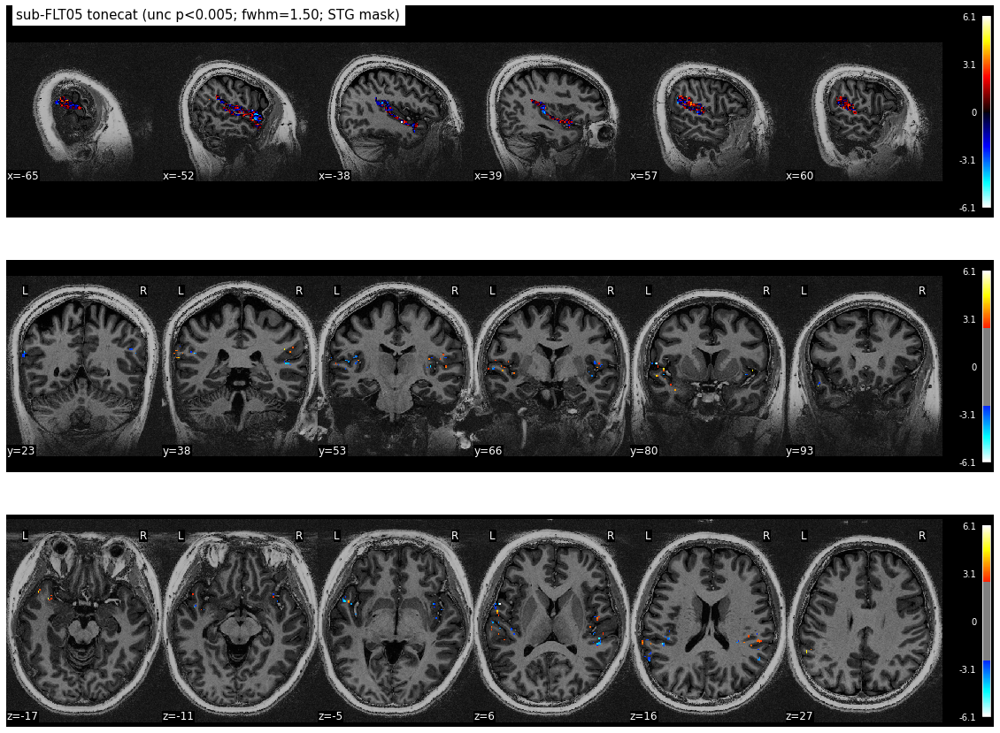

In [95]:
# plot
fig, axes = plt.subplots(3, 1, figsize=(20, 15))
plotting.plot_stat_map(masked_img, bg_img=t1w_fpath, colorbar=True, #threshold=thresh_unc,
                      title='sub-%s %s (unc p<%.03f; fwhm=%.02f; STG mask)'%(model.subject_label, 
                                                                   task_label,p_val,fwhm_sub),
                      axes=axes[0],
                      display_mode='x', cut_coords=6)
plotting.plot_stat_map(masked_img, bg_img=t1w_fpath, colorbar=True, threshold=thresh_unc,
                       axes=axes[1],
                       display_mode='y', cut_coords=6)
plotting.plot_stat_map(masked_img, bg_img=t1w_fpath, colorbar=True, threshold=thresh_unc,
                       axes=axes[2],
                       display_mode='z', cut_coords=6)
plotting.show()

# save plot
plot_fpath = os.path.join(nilearn_dir, 
                          'sub-%s_task-%s_fwhm-%.02f_pval-%.03f_space-%s_mask-aud.png'%(model.subject_label,
                                                                    task_label,fwhm_sub, p_val,
                                                                    space_label))
#fig.savefig(plot_fpath)

#### Load subcortical (MNI space) regions

In [46]:
import nibabel as nib

In [50]:
subcort_atlas_fpath = os.path.join('/bgfs/bchandrasekaran/krs228/',
                                   'data/reference/',
                                   'MNI_space/atlases/',
                                   'sub-invivo_MNI_rois.nii.gz')
subcort_img = nib.load(subcort_atlas_fpath)
print(np.unique(subcort_img.get_fdata()))

[0. 1. 2. 3. 4. 5. 6. 7. 8.]


In [54]:
sub_id = models[sx].subject_label
## NOT YET RUN IN MNI SPACE - WILL NOT WORK FOR OTHER SUBJECTS BESIDES FLT01
zmap_example_fpath = os.path.join('/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/',
                                      'derivatives/nilearn/level-1_fwhm-1.50/',
                                      'sub-%s_space-MNI152NLin2009cAsym/trial_models/run00/'%sub_id,
                                      'sub-%s_task-tonecat_fwhm-1.50_space-MNI152NLin2009cAsym_contrast-di1_aN_trial3_run00_zmap.nii.gz'%sub_id)
zmap = nib.load(zmap_example_fpath)

subcort_func_img = resample_to_img(subcort_img, zmap, interpolation='nearest')

In [55]:
print(subcort_img.get_fdata().shape)
print(zmap.get_fdata().shape)
print(subcort_func_img.get_fdata().shape)
print(np.unique(subcort_func_img.get_fdata()))

(720, 600, 840)
(129, 153, 129)
(129, 153, 129)
[0. 1. 2. 3. 4. 5. 6. 7. 8.]


In [56]:
mask_IC = np.zeros(zmap.shape)
mask_IC[np.where(subcort_func_img.get_fdata() == 5)] = 1
mask_IC[np.where(subcort_func_img.get_fdata() == 6)] = 1
print(np.unique(mask_IC))

[0. 1.]


In [58]:
print(nilearn_dir)

/bgfs/bchandrasekaran/krs228/data/FLT/derivatives/nilearn


In [59]:
# create nifti-like image and save to nifti file
mask_IC_img = nib.Nifti1Image(mask_IC, affine = zmap.affine)

mask_IC_fpath = os.path.join(nilearn_dir,
                                         'sub-%s_space-%s_mask-IC.nii.gz'%(model.subject_label, 
                                                                           space_label))
nib.save(mask_IC_img, mask_IC_fpath)

## Decoding

In [8]:
from glob import glob

from nilearn.decoding import Decoder
from nilearn.input_data import NiftiMasker

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [11]:
#sx = 1
sub_id = 'FLT01'
fwhm_sub = 1.5
space_label = 'T1w' #'MNI152NLin2009cAsym' 

nilearn_sub_dir = os.path.join(bidsroot, 'derivatives', 'nilearn', 
                                               'level-1_fwhm-%.02f'%fwhm_sub, 
                                               'sub-%s_space-%s'%(sub_id, space_label))
                                               #'sub-%s_space-%s'%(models[sx].subject_label, space_label))


print(nilearn_sub_dir)

z_maps = sorted(glob(nilearn_sub_dir+'/trial_models'+'/run*/*di*nii.gz'))
print('# of z-maps: ', len(z_maps))

#conditions = stim_list * len(imgs)
#conditions = [os.path.basename(x)[68:74] for x in z_maps] # for MNI directory
conditions = [os.path.basename(x)[52:58] for x in z_maps] # for T1w directory
print('# of conditions: ', len(conditions))

print(conditions[:10])

print('unique # of conditions = ', np.unique(conditions).shape)

conditions_tone = [stim[:3] for stim in conditions]
print(conditions_tone[:10])

conditions_talker = [stim[4:6] for stim in conditions]
print(conditions_talker[:10])

/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT01_space-T1w
# of z-maps:  188
# of conditions:  188
['di1_aN', 'di1_aN', 'di1_aN', 'di1_bN', 'di1_bN', 'di1_bN', 'di1_hN', 'di1_hN', 'di1_hN', 'di1_iN']
unique # of conditions =  (16,)
['di1', 'di1', 'di1', 'di1', 'di1', 'di1', 'di1', 'di1', 'di1', 'di1']
['aN', 'aN', 'aN', 'bN', 'bN', 'bN', 'hN', 'hN', 'hN', 'iN']


### Nilearn `Decoder` accuracies

from https://nilearn.github.io/auto_examples/02_decoding/plot_haxby_glm_decoding.html#build-the-decoding-pipeline

**note: does not generate predictions for each fold, so cannot use for confusion matrix generation**

In [67]:
# available space-T1w masks: aud_mask_func_img, lh_mask_func_img, rh_mask_func_img
# available space-MNI masks: mask_IC_img
mask_descrip = 'aud-ctx'
mask_fpath = nib.load(os.path.join(nilearn_dir, 'sub-%s_mask-%s.nii.gz'%(models[sx].subject_label, mask_descrip)))
#mask = mask_IC_fpath
decoder=Decoder(estimator='svc', mask=mask_fpath,
                standardize=False,
                screening_percentile=10, 
                cv=10,
               )
decoder.fit(z_maps, conditions)

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [    0     1    21    31   201   205   209   213  2886  4650  4918  5122
  5319  5328  5329  5598  5664  5765  7689  8037  8045  8357  8366  8367
  8649  8659  8660  8662  8670  8671  8672  8673  8676  8678  8679  8680
  8971  8972  9498  9743  9750  9991 10769 11035 11038 11043 11044 11045
 11046 11047 11050 11051 11052 11053 11056 11057 11317 11318 11321 11322
 11323 11324 11325 11326 11328 11329 11330 11331 11332 11333 11335 11336
 11337 11338 11339 11341 11342 11343 11566 11572 11573 11579 11585 11591
 11592 11594 11595 11596 11597 11598 11599 11600 11601 11602 11603 11604
 11605 11612 11667 11752 11756 11759 11763 11764 11766 11767 11768 11769
 11770 11788 11797 11803 11804 11808 11809 11816 11823] are constant.
  # flatten matrix to vector in sparse case
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/pyt

In [68]:
print(decoder.cv_params_)

print('# of CV folds: ', decoder.cv)
classification_accuracy = np.mean(list(decoder.cv_scores_.values()))
chance_level = 1. / len(np.unique(conditions))
print('{} classification accuracy: {:4f} / Chance level: {}'.format(
       models[sx].subject_label, classification_accuracy, chance_level))

{'di1_aN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di1_bN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di1_hN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di1_iN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di2_aN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di2_bN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di2_hN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di2_iN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di3_aN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di3_bN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di3_hN': {'C': [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]}, 'di3_iN': {'C': [100

saved figure to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/masked_data/FLT03_space-T1w_roi-aud-ctx_trial_decoding_accuracy.png


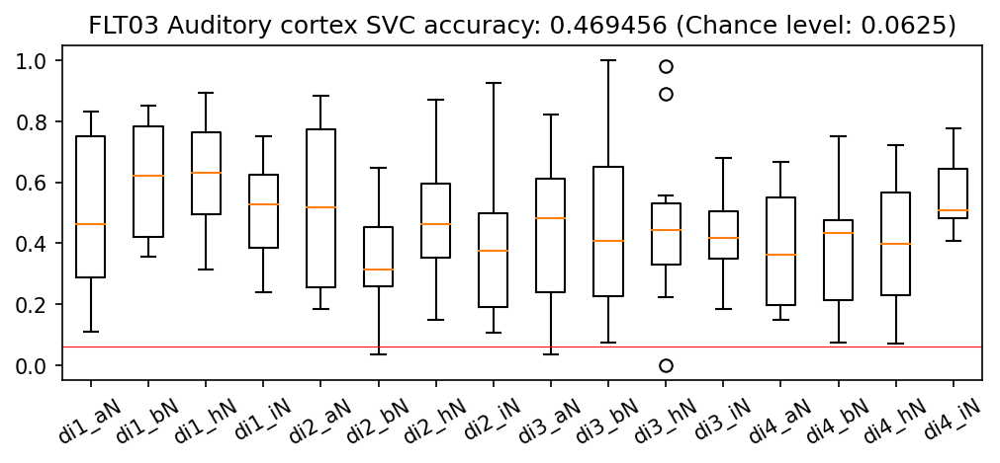

In [69]:
# Create and save prediction accuracy plot

os.makedirs(os.path.join(nilearn_sub_dir, 'trial_models', 'masked_data'), exist_ok=True)

region_string = 'Auditory cortex'

acc_plot_fpath = os.path.join(nilearn_sub_dir, 'trial_models', 'masked_data',
                                '%s_space-%s_roi-%s_trial_decoding_accuracy.png'%(models[sx].subject_label, 
                                                                           space_label,
                                                                           mask_descrip))

from matplotlib import pyplot as plt
plt.figure(figsize=(8,3), dpi=150)
plt.boxplot(list(decoder.cv_scores_.values()));
plt.axhline(y=chance_level, color='r', linewidth=0.5)
plt.title('{} {} SVC accuracy: {:3f} (Chance level: {})'.format(
            models[sx].subject_label, region_string, classification_accuracy, chance_level))
#plt.xlabel('stimulus')
#plt.ylabel('accuracy')
plt.xticks(range(1,17), np.unique(conditions), rotation=30);
#plt.xticks(range(1,5), np.unique(conditions_tone));
plt.savefig(acc_plot_fpath)
print('saved figure to ', acc_plot_fpath)

In [71]:
len(decoder.coef_img_)

16

In [77]:
decoder.coef_img_[decoder_img]

In [81]:
# save 4-D decoding coefficient images to nifti (3-D x trial type prediction)
decoding_dir = os.path.join(nilearn_sub_dir, 'trial_models', 'masked_data', 'decoding')
os.makedirs(decoding_dir, exist_ok=True)
print('saving files to ', decoding_dir)

for ix, decoder_cond in enumerate(decoder.coef_img_):
    decoder_img = decoder.coef_img_[decoder_cond]
    decoder_img_fpath = os.path.join(decoding_dir,
                                     '%s_space-%s_roi-%s_trial_decoding_cond-%s.nii.gz'%(models[sx].subject_label, 
                                                                               space_label,
                                                                               mask_descrip,
                                                                               decoder_cond))
    nib.save(decoder_img, decoder_img_fpath)

saving files to  /bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/masked_data/decoding


In [94]:
# Extract and save masked timeseries data (for analyzing outside of Decoder method)

masker = NiftiMasker(mask_img=mask_fpath, smoothing_fwhm=None, standardize=False)
masked_data = masker.fit_transform(z_maps)

print(masked_data.shape)

masked_data_fpath = os.path.join(nilearn_sub_dir, 'trial_models', 'masked_data',
                                '%s_space-%s_roi-%s_trial_zmaps.csv'%(models[sx].subject_label, 
                                                                      space_label,
                                                                      mask_descrip))
#np.savetxt(masked_data_fpath, masked_data)
print(masked_data_fpath)

conditions_fpath = os.path.join(nilearn_sub_dir, 'trial_models', 'masked_data',
                                '%s_space-%s_roi-%s_trial_conditions.csv'%(models[sx].subject_label, 
                                                                           space_label,
                                                                           mask_descrip))
#np.savetxt(conditions_fpath, conditions, fmt='%s')
print(conditions_fpath)

(288, 11835)
/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/masked_data/FLT03_space-T1w_roi-aud-ctx_trial_zmaps.csv
/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/masked_data/FLT03_space-T1w_roi-aud-ctx_trial_conditions.csv


In [96]:
print(z_maps)

['/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/run00/sub-FLT03_task-tonecat_fwhm-1.50_space-T1w_contrast-di1_aN_trial1_run00_zmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/run00/sub-FLT03_task-tonecat_fwhm-1.50_space-T1w_contrast-di1_aN_trial2_run00_zmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/run00/sub-FLT03_task-tonecat_fwhm-1.50_space-T1w_contrast-di1_aN_trial3_run00_zmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/run00/sub-FLT03_task-tonecat_fwhm-1.50_space-T1w_contrast-di1_bN_trial1_run00_zmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-1.50/sub-FLT03_space-T1w/trial_models/run00/sub-FLT03_task-tonecat_fw

### Confusion matrix

In [56]:
#masked_data_fpath = os.path.join('/bgfs/bchandrasekaran/krs228/data/FLT/',
#                                   'data_bids/derivatives/nilearn/level-1_fwhm-1.50/',
#                                   'sub-FLT01_space-MNI152NLin2009cAsym/trial_models/masked_data/',
#                                   'FLT01_roi-IC_trial_zmaps.csv')
masked_data_fpath = os.path.join('/bgfs/bchandrasekaran/krs228/data/FLT/',
                                   'data_bids/derivatives/nilearn/level-1_fwhm-1.50/',
                                   'sub-FLT01_space-T1w/trial_models/masked_data/',
                                   'FLT01_space-T1w_roi-actx_trial_zmaps.csv')

masked_data = np.genfromtxt(masked_data_fpath)

In [57]:
n_train = round(len(z_maps)*0.75)
n_test = len(z_maps) - n_train

In [58]:
# first, run a new classifier with a separate training and test set
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn import svm

In [59]:
cv = KFold(n_splits=10)

clf = svm.LinearSVC()

In [60]:
# run SVM with cross-validation and create confusion matrix
from sklearn.model_selection import cross_val_predict
y_pred = cross_val_predict(clf, masked_data, conditions, cv=10)
conf_mat = confusion_matrix(conditions, y_pred)

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Libline

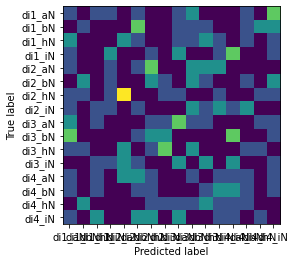

In [64]:
#print('input data file: ', masked_data_fpath)
ConfusionMatrixDisplay.from_predictions(conditions, y_pred, 
                                        cmap='viridis', colorbar=False, include_values=False)

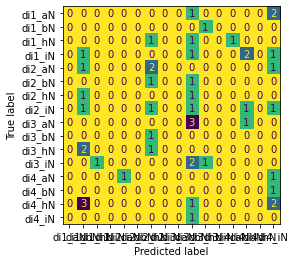

In [38]:
# SVM with no cross validation
X_train, X_test, y_train, y_test = train_test_split(masked_data, conditions)
clf.fit(X_train, y_train)

ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, cmap='viridis_r', colorbar=False)
plt.show()

#### TEST: confusion matrix using decoder (then replaced by SVM) 

In [103]:
cv = KFold(n_splits=10)
fold = 0
prediction = []
test_conds = []
for train, test in cv.split(conditions):
    fold += 1
    subdecode=svm.LinearSVC()
    
    # fit on the training set
    print('# of training images: ', n_train)
    print('# of testing images:  ', n_test)

    print('fitting the training data')
    subdecode.fit(masked_data[train, :], np.array(conditions)[train])
    
    # test
    print('predicting the test images')
    y_pred = subdecode.predict(masked_data[test, :])
    #print(y_pred)
    prediction.append(y_pred)
    
    #print(np.array(conditions)[test])
    test_conds.append(np.array(conditions)[test])

# of training images:  216
# of testing images:   72
fitting the training data
predicting the test images
['di4_aN' 'di4_aN' 'di3_bN' 'di3_iN' 'di4_bN' 'di3_iN' 'di3_hN' 'di4_hN'
 'di3_hN' 'di3_hN' 'di3_hN' 'di3_iN' 'di3_iN' 'di4_hN' 'di4_bN' 'di4_hN'
 'di3_hN' 'di3_iN' 'di4_bN' 'di4_hN' 'di4_hN' 'di3_iN' 'di4_bN' 'di3_iN'
 'di4_bN' 'di4_hN' 'di4_hN' 'di4_iN' 'di4_hN']
# of training images:  216
# of testing images:   72
fitting the training data
predicting the test images
['di1_aN' 'di1_hN' 'di1_bN' 'di3_aN' 'di1_aN' 'di1_aN' 'di2_iN' 'di2_aN'
 'di1_aN' 'di1_bN' 'di1_hN' 'di2_iN' 'di1_bN' 'di1_iN' 'di1_aN' 'di2_hN'
 'di1_bN' 'di1_aN' 'di2_bN' 'di3_iN' 'di4_bN' 'di3_iN' 'di3_iN' 'di2_bN'
 'di4_bN' 'di4_bN' 'di4_iN' 'di3_hN' 'di2_hN']
# of training images:  216
# of testing images:   72
fitting the training data
predicting the test images
['di4_hN' 'di4_hN' 'di1_iN' 'di1_bN' 'di3_hN' 'di4_hN' 'di1_bN' 'di4_iN'
 'di1_iN' 'di4_hN' 'di4_hN' 'di2_aN' 'di4_hN' 'di1_bN' 'di2_aN' 'di4_hN'
 'di

In [102]:
test_conds

[array(['di1_aN', 'di1_aN', 'di1_aN', 'di1_bN', 'di1_bN', 'di1_bN',
        'di1_hN', 'di1_hN', 'di1_hN', 'di1_iN', 'di1_iN', 'di1_iN',
        'di2_aN', 'di2_aN', 'di2_aN', 'di2_bN', 'di2_bN', 'di2_bN',
        'di2_hN', 'di2_hN', 'di2_hN', 'di2_iN', 'di2_iN', 'di2_iN',
        'di3_aN', 'di3_aN', 'di3_aN', 'di3_bN', 'di3_bN', 'di3_bN',
        'di3_hN', 'di3_hN', 'di3_hN', 'di3_iN', 'di3_iN', 'di3_iN',
        'di4_aN', 'di4_aN', 'di4_aN', 'di4_bN', 'di4_bN', 'di4_bN',
        'di4_hN', 'di4_hN', 'di4_hN', 'di4_iN', 'di4_iN', 'di4_iN',
        'di1_aN', 'di1_aN', 'di1_aN', 'di1_bN', 'di1_bN', 'di1_bN',
        'di1_hN', 'di1_hN', 'di1_hN', 'di1_iN'], dtype='<U6'),
 array(['di1_iN', 'di1_iN', 'di2_aN', 'di2_aN', 'di2_aN', 'di2_bN',
        'di2_bN', 'di2_bN', 'di2_hN', 'di2_hN', 'di2_hN', 'di2_iN',
        'di2_iN', 'di2_iN', 'di3_aN', 'di3_aN', 'di3_aN', 'di3_bN',
        'di3_bN', 'di3_bN', 'di3_hN', 'di3_hN', 'di3_hN', 'di3_iN',
        'di3_iN', 'di3_iN', 'di4_aN', 'di4_aN', 'di4_

In [101]:
for fx in range(len(prediction)):
    print(prediction[fx]==test_conds[fx])

[False False False False False False False False False False False False
 False False False False  True  True False False  True False False False
  True  True False False False False False False False False False False
 False False False False  True False False False False False False False
 False False False False False False False False False False]
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False]
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False


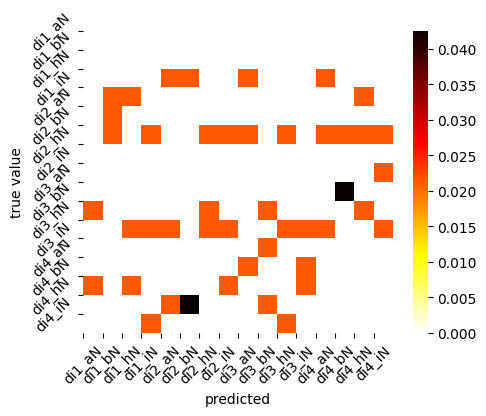

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.0212766  0.0212766
  0.         0.         0.0212766  0.         0.         0.
  0.0212766  0.         0.         0.        ]
 [0.         0.0212766  0.0212766  0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.0212766  0.        ]
 [0.         0.0212766  0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.0212766  0.         0.0212766  0.         0.
  0.0212766  0.0212766  0.0212766  0.         0.0212766  0.
  0.0212766  0.0212766  0.0212766  0.0

In [346]:
import seaborn as sns
plt.figure(figsize=(5,4),dpi=100)
confusion_mat = confusion_matrix(y_pred, conditions[n_train:], normalize='all')
ax = sns.heatmap(confusion_mat, 
                 cmap='hot_r',
                )

ax.set_xticks(range(len(np.unique(conditions))))
ax.set_yticks(range(len(np.unique(conditions))))
ax.set_xticklabels(np.unique(conditions), rotation=45)
ax.set_yticklabels(np.unique(conditions), rotation=45)

#ax.set_xticklabels(range(1,5))
#ax.set_yticklabels(range(1,5))

ax.set_xlabel('predicted')
ax.set_ylabel('true value')

plt.show()
print(confusion_mat)

#### Plot decoder maps

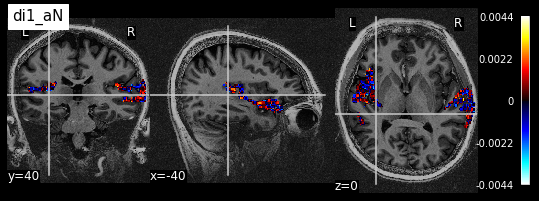

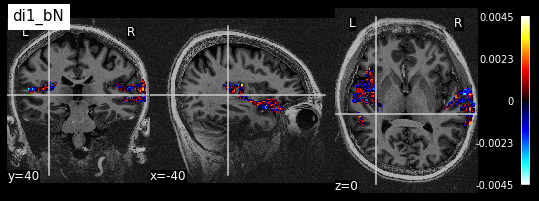

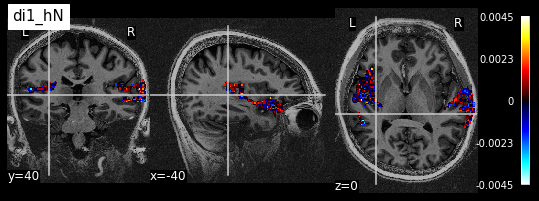

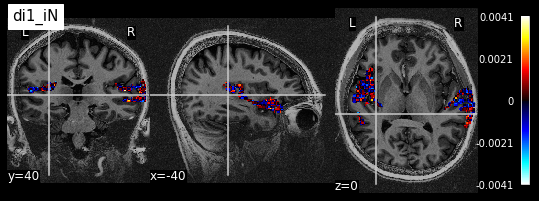

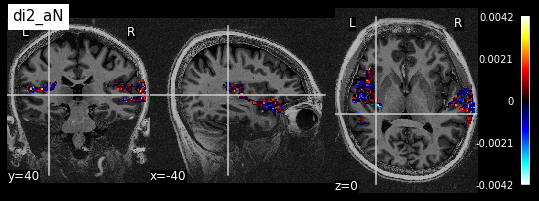

...

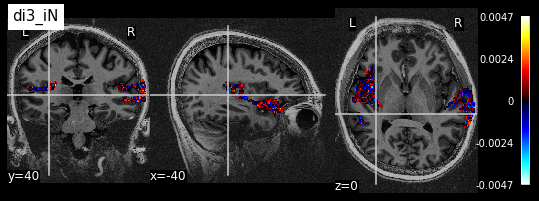

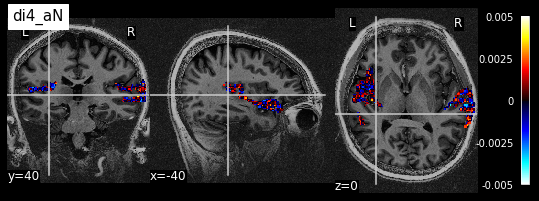

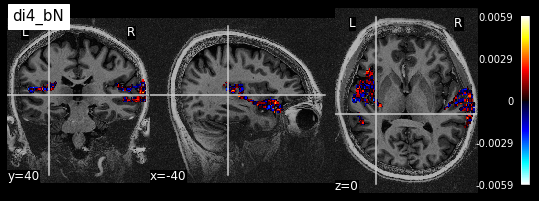

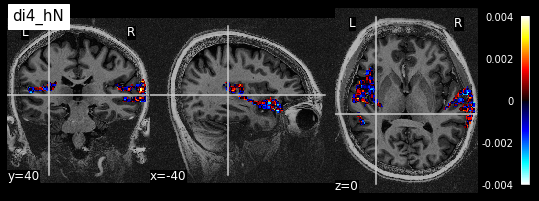

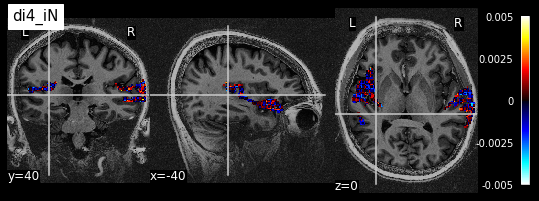

In [93]:
# T1w space (ACtx)
t1w_fpath = layout.get(return_type='filename', subject=sub_id, suffix='T1w', extension='nii.gz')[0]

# plot
for stim in np.unique(conditions): #stim_list:
    decoder_img = decoder.coef_img_[stim]
    plotting.plot_stat_map(decoder_img, bg_img=t1w_fpath, colorbar=True, 
                           title=stim,
                           cut_coords=[-40, 40, 0]
                           #axes=axes[0],
                           #display_mode='x', cut_coords=6
                           )

plotting.show()


In [113]:
# MNI space (IC)
t1w_mni_fpath = os.path.join('/bgfs/bchandrasekaran/krs228/data/FLT/',
                             'derivatives', 'fmriprep_2022.03.22',
                             'sub-FLT01/anat',
                             'sub-FLT01_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz')

# plot
for stim in np.unique(conditions): #stim_list:
    decoder_img = decoder.coef_img_[stim]
    plotting.plot_stat_map(decoder_img, bg_img=t1w_mni_fpath, colorbar=True, 
                           title=stim,
                           cut_coords=[1, -35, -9]
                           #axes=axes[0],
                           #display_mode='x', cut_coords=6
                           )

plotting.show()


### WIP: Model each event

Need a model for each trial.

Examples:
 - https://neurostars.org/t/extract-betas-from-each-trial-at-single-voxel-level/21067/57
 - https://nibetaseries.readthedocs.io/en/stable/betaseries.html

In [ ]:
import copy

In [ ]:
rx = 0
run_events = copy.copy(models_events[0][rx])
run_events

In [ ]:
orig_trial_types = run_events['trial_type'].unique()
print(orig_trial_types)

### striatum

In [ ]:
import nilearn.decoding
from scipy.ndimage import binary_dilation, binary_erosion
from nilearn.image import resample_to_img

In [ ]:
print(aparc_fpath)
aparc_img = nib.load(aparc_fpath)
aparc_data = aparc_img.get_fdata()
aparc_affine = aparc_img.affine
print(aparc_affine)

In [ ]:
t1w_img = nib.load(t1w_fpath)
t1w_affine=t1w_img.affine
print(t1w_affine)

#### define striatum masks

In [ ]:
lh_mask = np.zeros(aparc_data.shape)
lh_mask[np.where(aparc_data == 11)] = 1
lh_mask[np.where(aparc_data == 12)] = 1
lh_mask[np.where(aparc_data == 13)] = 1
lh_mask[np.where(aparc_data == 26)] = 1

rh_mask = np.zeros(aparc_data.shape)
rh_mask[np.where(aparc_data == 50)] = 1
rh_mask[np.where(aparc_data == 51)] = 1
rh_mask[np.where(aparc_data == 52)] = 1
rh_mask[np.where(aparc_data == 58)] = 1

In [ ]:
lh_mask_img = nib.Nifti1Image(lh_mask, aparc_affine)
rh_mask_img = nib.Nifti1Image(rh_mask, aparc_affine)

In [ ]:
striatum_mask = np.zeros(aparc_data.shape)
striatum_mask[np.where(lh_mask == 1)] = 1
striatum_mask[np.where(rh_mask == 1)] = 1

striatum_mask_ero = binary_erosion(striatum_mask).astype(striatum_mask.dtype)
striatum_mask_dil = binary_dilation(striatum_mask).astype(striatum_mask.dtype)

striatum_mask_erodil = binary_dilation(striatum_mask_ero).astype(striatum_mask_ero.dtype)


striatum_mask_fs_img = nib.Nifti1Image(striatum_mask, affine=aparc_affine)
striatum_mask_ero_fs_img = nib.Nifti1Image(striatum_mask_ero, affine=aparc_affine)
striatum_mask_dil_fs_img = nib.Nifti1Image(striatum_mask_dil, affine=aparc_affine)

striatum_mask_erodil_fs_img = nib.Nifti1Image(striatum_mask_erodil, affine=aparc_affine)


striatum_mask_anat_img = resample_to_img(striatum_mask_erodil_fs_img, t1w_fpath, 
                                         interpolation='nearest')
striatum_mask_func_img = resample_to_img(striatum_mask_anat_img, zmap, 
                                         interpolation='nearest')

In [ ]:
# DO NOT USE plotting.view_img – crashes the computer
plotting.plot_stat_map(striatum_mask_anat_img, bg_img=t1w_fpath, 
                       colorbar=False)#,
                       #display_mode='y', cut_coords=[60,70,80,90]);

In [ ]:
plotting.plot_stat_map(striatum_mask_func_img, bg_img=t1w_fpath, 
                       colorbar=False)

In [ ]:
nib.save(striatum_mask_anat_img,'sub-%s_mask-striatum.nii.gz'%model.subject_label)

### Decoding

In [ ]:
import nilearn.decoding
from nilearn.decoding import Decoder

In [ ]:
models_events[0]

In [ ]:
bold_list = [os.path.abspath(run) for run in models_run_imgs[0]]


In [ ]:
print(models_events[0][0]['trial_type'])

In [ ]:
runx = 0
fmri_img = nib.load(bold_list[runx])
conditions = models_events[0][runx]['trial_type']

In [ ]:
conditions

In [ ]:
mask_filename = striatum_mask_anat_img
decoder = Decoder(estimator='svc', mask=mask_filename, standardize=True)

In [ ]:
func_img=models_run_imgs[0][runx]

In [ ]:
print(func_img)
print(nib.load(func_img).get_fdata().shape)

In [ ]:
# 121 fmri timepoints, but only 120 trials. need to reduce
from nilearn.image import index_img
func_120_img = index_img(func_img, slice(0,120))

In [ ]:
decoder.fit(func_120_img, conditions)

In [ ]:
testx = 1
test_img = index_img(models_run_imgs[0][testx],slice(0,120))
test_conds = models_events[0][testx]['trial_type']

In [ ]:
prediction = decoder.predict(test_img)
print(prediction)

In [ ]:
print((prediction == test_conds).sum() / float(len(test_conds)))

## Searchlight decoding

In [ ]:
# create mask
from nilearn.masking import compute_epi_mask
mask_img = compute_epi_mask(fmri_img)

In [ ]:
from nilearn.image import resample_to_img

# create ROI mask
process_mask_img = lh_mask_img

# resample to functional space (was created from T1w freesurfer output)
process_mask_space_func_img = resample_to_img(process_mask_img, mask_img, interpolation='nearest')
process_mask = process_mask_space_func_img.get_fdata()

In [ ]:
# create searchlight
searchlight = nilearn.decoding.SearchLight(mask_img, process_mask_space_func_img, radius=fwhm_sub, n_jobs=4, verbose=1)

In [ ]:
# fit searchlight to image
searchlight.fit(fmri_img, y)

In [ ]:
from nilearn.input_data import NiftiMasker
from nilearn.image import get_data
# For decoding, standardizing is often very important
nifti_masker = NiftiMasker(mask_img=mask_img,
                           standardize=True, memory='nilearn_cache',
                           memory_level=1)
fmri_masked = nifti_masker.fit_transform(fmri_img)

from sklearn.feature_selection import f_classif
f_values, p_values = f_classif(fmri_masked, y)
p_values = -np.log10(p_values)
p_values[p_values > 10] = 10
p_unmasked = get_data(nifti_masker.inverse_transform(p_values))

In [ ]:
min(p_values)

In [ ]:
from nilearn import image
from nilearn.image import new_img_like
mean_fmri = image.mean_img(fmri_img)


from nilearn.plotting import plot_stat_map, plot_img, show
searchlight_img = new_img_like(mask_img, searchlight.scores_, affine=mask_img.affine)
#searchlight_resamp_img = resample_to_img(searchlight_img, mask_img)

In [ ]:
print(searchlight.scores_.shape)
print(searchlight_img.shape)
print(mean_fmri.shape)
print(p_unmasked.shape)
print(process_mask.shape)

In [ ]:
# Because scores are not a zero-center test statistics, we cannot use
# plot_stat_map
plot_img(searchlight_img, bg_img=mean_fmri,
         title="Searchlight", display_mode="z", cut_coords=[-10, -5, 0, 5, 10],
         vmin=.0, cmap='hot', threshold=1, black_bg=True)

# F_score results
p_ma = np.ma.array(p_unmasked, mask=np.logical_not(process_mask))
f_score_img = new_img_like(mean_fmri, p_ma)
plot_stat_map(f_score_img, mean_fmri,
              title="F-scores", display_mode="z",
              cut_coords=[-10, -5, 0, 5, 10], alpha=.5,
              colorbar=True)

show()

In [ ]:
# test mask images - should only be within STG
plotting.plot_roi(process_mask_space_func_img, bg_img=t1w_fpath, cmap='Paired')
plotting.plot_roi(process_mask_space_func_img, bg_img=mean_fmri, cmap='Paired')

### MNI space

In [ ]:
space_label = 'MNI152NLin2009cAsym'

task_label = 'listen'
fwhm_sub = 3.75

models, models_run_imgs, models_events, models_confounds = \
    first_level_from_bids(data_dir, task_label, space_label,
                          smoothing_fwhm=fwhm_sub,
                          derivatives_folder=derivatives_folder)

In [ ]:
# check model image files
print([os.path.basename(run) for run in models_run_imgs[0]])

# check model confounds
print(models_confounds[0][0].columns)

In [ ]:
# fill n/a with 0
[[mc.fillna(0, inplace=True) for mc in sublist] for sublist in models_confounds]

# define which confounds to keep as nuisance regressors
conf_keep_list = ['framewise_displacement',
                  'a_comp_cor_00', 'a_comp_cor_01', 
                  'a_comp_cor_02', 'a_comp_cor_03', 
                  'a_comp_cor_04', 'a_comp_cor_05', 
                  'a_comp_cor_06', 'a_comp_cor_07', 
                  'a_comp_cor_08', 'a_comp_cor_09', 
                  'trans_x', 'trans_y', 'trans_z', 
                  'rot_x','rot_y', 'rot_z']

models_confounds[0][0][conf_keep_list]

In [ ]:
# check conditions
print(models_events[0][0]['trial_type'].value_counts())

In [ ]:
contrast_label = 'sound-silent'

fig, axes = plt.subplots(figsize=(12, 6))
model_and_args = zip(models, models_run_imgs, models_events, models_confounds)
for midx, (model, imgs, events, confounds) in enumerate(model_and_args):    
    confounds_ltd = [models_confounds[midx][cx][conf_keep_list] for cx in range(len(models_confounds[midx]))]
    # fit the GLM
    model.fit(imgs, events, confounds_ltd)
    # compute the contrast of interest
    zmap = model.compute_contrast(contrast_label)
    plotting.plot_glass_brain(zmap, colorbar=True, threshold=p001_unc,
                          title='sub-%s %s (unc p<%.03f; fwhm=%.02f)'%(model.subject_label, 
                                                                       task_label,p_val,fwhm_sub),
                          axes=axes,
                          plot_abs=False, display_mode='ortho')
    
    # save z map
    nilearn_sub_dir = os.path.join(bidsroot, 'derivatives', 'nilearn', 
                                   'level-1_fwhm-%.02f'%fwhm_sub, 'sub-%s'%model.subject_label)
    if not os.path.exists(nilearn_sub_dir):
        os.makedirs(nilearn_sub_dir)
    zmap_fpath = os.path.join(nilearn_sub_dir,
                              'sub-%s_task-%s_fwhm-%.02f_zmap.nii.gz'%(model.subject_label,task_label, fwhm_sub))
    nib.save(zmap, zmap_fpath)
    
    # save report
    report_fpath = os.path.join(nilearn_sub_dir,
                                'sub-%s_task-%s_fwhm-%.02f_report.html'%(model.subject_label,task_label, fwhm_sub))
    report = make_glm_report(model=model,
                             contrasts=contrast_label)
    report.save_as_html(report_fpath)
plotting.show()
# save plot
plot_fpath = os.path.join(nilearn_dir, 'sub-%s_task-%s_fwhm-%.02f.png'%(model.subject_label,task_label,fwhm_sub))
fig.savefig(plot_fpath)

### plot to surface

In [ ]:
from nilearn.datasets import fetch_surf_fsaverage
fsaverage = fetch_surf_fsaverage(mesh='fsaverage5')

plotting.plot_img_on_surf(zmap, surf_mesh='fsaverage5', 
                          hemispheres=['left','right'], views=['lateral', 'medial'],
                          title="sub-%s task-%s fwhm-%.02fmm"%(model.subject_label, task_label, fwhm_sub),
                          threshold=2., colorbar=True,
                          output_filestr=os.path.join(nilearn_dir,
                                                      'sub-%s_task-%s_fwhm-%.02f_surface.png'%(model.subject_label, 
                                                                                               task_label,fwhm_sub)))

### plot model matrices

In [ ]:
from nilearn.plotting import plot_contrast_matrix
plot_contrast_matrix(contrast_label, model.design_matrices_[0])

In [ ]:
from nilearn.plotting import plot_design_matrix
plot_design_matrix(model.design_matrices_[0])
plt.show()